In [1]:
import os
import numpy as np
import pandas as pd
import time
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import random
import seaborn as sns
from sklearn.utils import shuffle
import platform
import re
from sklearn.feature_extraction.text import TfidfVectorizer

In [2]:
df0 = pd.read_csv("E:/CNSI_project/demo_and_data_5.0/Processed_data/MIMIC/aim2_dataAll_filtered_NameShorted.csv")
df0

,subject_id,hadm_id,chartdate,B_Albumin,B_AlkalinePhosphatase,B_Calcium,B_Chloride,B_LactateDehydrogenase,B_Phosphate,B_UreaNitrogen,...,age,resprate,acuity,Chief Complaint,icd_title,History of Present Illness,Past Medical History,Allergies,Family History,hospital_expire_flag
0,10001217,24597018,2157/11/19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,55,16.0,3.0,"LEFT HAND PAINS, Left hand and face numbness, ...",Cerebral edema; Compression of brain; Family h...,Mrs. ___ is a ___ y/o F from ___ with history ...,Multiple sclerosis,Penicillins,"Mother with pancreatic cancer, brother-lung ca...",0
1,10003019,21616816,2174/9/18,2.6,NaN,10.4,102.0,NaN,2.8,32.0,...,72,16.0,2.0,"FEVER/MS CHANGES, confusion, rehab placement","Acute kidney failure, unspecified; Asthma, uns...","___ male w/ PMH of sarcoidosis, sleep apnea, n...","1. Sarcoidosis, dx skin bx:intestinal & pulmon...",Oxycodone / Ragweed,"Mother:___, cardiac disease. Father:diverticul...",0
2,10005808,26543907,2119/1/2,NaN,48.0,9.3,105.0,NaN,2.5,18.0,...,53,NaN,NaN,limb weakness and tingling,Acute infective polyneuritis,Mr. ___ is a ___ year old right handed gentlem...,Hiatal hernia in ___ Occasional heartburn,No Known Allergies / Adverse Drug Reactions,He has no family history of autoimmune disease...,0
3,10006269,27357430,2124/6/26,4.9,80.0,NaN,95.0,NaN,NaN,15.0,...,51,19.0,3.0,"Fever, Headache",Duodenitis without bleeding; Essential (primar...,NaN,NaN,No Known Allergies / Adverse Drug Reactions,NaN,0
4,10014078,25809882,2166/8/22,NaN,NaN,8.1,117.0,NaN,2.8,7.0,...,60,NaN,NaN,seizure,Benign neoplasm of cerebral meninges; Diabetes...,The pt is a ___ year-old woman who presents as...,hx of atypical meningioma - grade 2 - resected...,No Known Allergies / Adverse Drug Reactions,noncontributory,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5790,19994772,29219051,2181/4/18,NaN,NaN,NaN,103.0,150.0,NaN,9.0,...,55,20.0,2.0,Aletered mental status and fever,Abnormal involuntary movements; Candidiasis of...,___ is a ___ woman with,PAST MEDICAL HISTORY:Recurrent glioblastoma in...,Keflex,Non-contributory.,0
5791,19994772,29606061,2180/12/18,NaN,NaN,9.7,103.0,NaN,3.3,16.0,...,54,NaN,NaN,Recurrent glioblastoma.,"Cerebral aneurysm, nonruptured; Compression of...",Ms. ___ is a ___ y/o F s/p resection of gliobl...,Hyperlipidemia,___,non-contributory,0
5792,19995080,23057109,2147/7/13,2.3,961.0,7.5,105.0,NaN,2.3,17.0,...,59,NaN,NaN,Confusion- Altered Mental Status- transfer fro...,Calculus of gallbladder and bile duct without ...,___ M with AIDS and med non-compliance (CD4 20...,"- AIDS off ART prescribed for Truvada T qd, Ka...",Penicillins,Father died of AD at age ___. Mother died of D...,0
5793,19999784,24935234,2119/7/7,4.3,NaN,NaN,NaN,102.0,NaN,NaN,...,57,16.0,2.0,"Abnormal MRI, weakness",Abnormal cytological findings in cerebrospinal...,Mr. ___ is a ___ without significant medical h...,PAST ONCOLOGIC HISTORY:___ is a ___ right-hand...,No Known Allergies / Adverse Drug Reactions,Father had prostate cancer. Denies otherwise ...,0


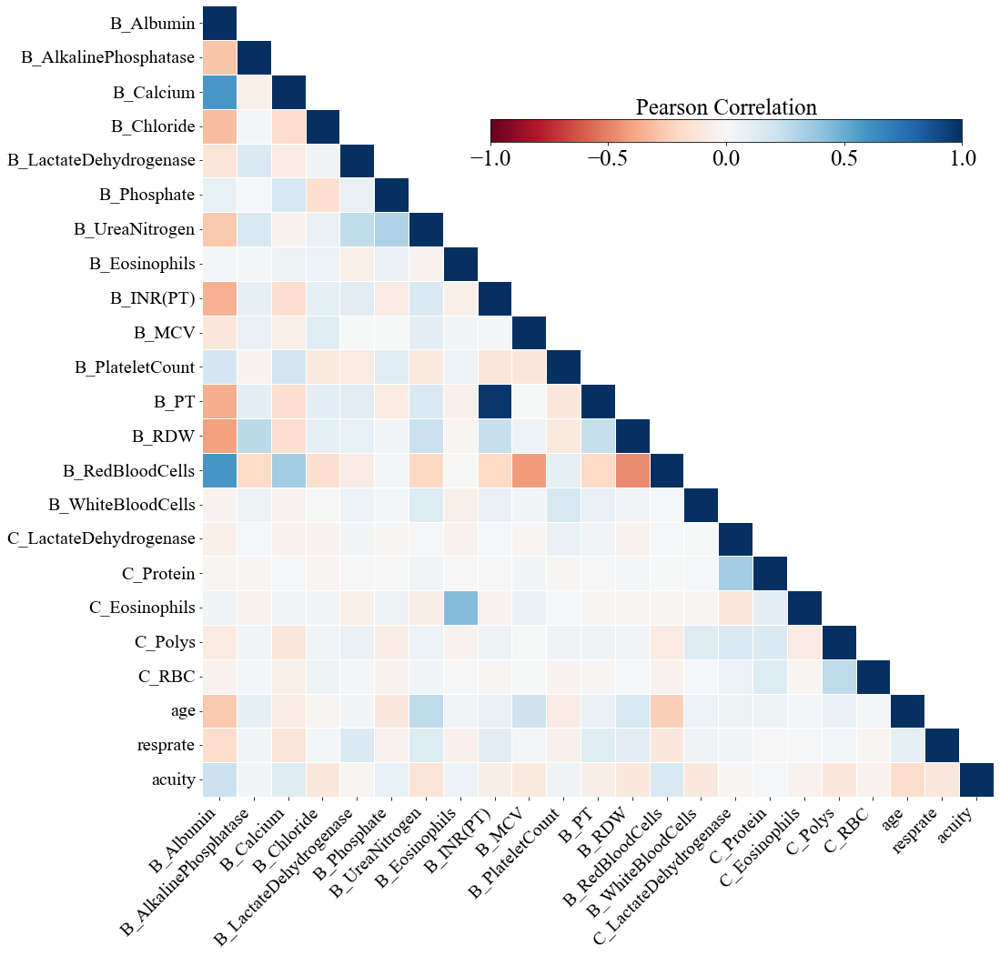

In [3]:
df_input1 = df0.iloc[:,3:-7]
#correlation
correlation = df_input1.corr()
#tick labels
matrix_cols = correlation.columns.tolist()
#convert to array
corr_array  = np.array(correlation)

# from pylab import mpl
import matplotlib as mpl
# mpl.rcParams['font.family'] = 'sans-serif'
# mpl.rcParams['font.sans-serif'] = 'NSimSun,Times New Roman'
mpl.rcParams['font.sans-serif'] = 'Times New Roman'
font = {'family': 'Times New Roman',
            'color': 'k',
            'weight': 'normal',
            'size': 25,}

mask = np.ones_like(corr_array, dtype=bool) 
mask[np.tril_indices_from(mask)] = False

fig = plt.figure(figsize=(16,16))
ax = sns.heatmap(data=corr_array, 
            cmap='RdBu',
            square=True,
            mask = mask,
            linewidths=1,
            linecolor="white",
#             annot=array_new,
            fmt='',
            annot_kws={"size":20},
            xticklabels=matrix_cols,
            yticklabels=matrix_cols,
            vmin=-1, vmax=1,
            cbar=False,
#             cbar_kws={"shrink": 0.6, "location":'top', "use_gridspec":False},
           )
plt.xticks([i + 0.5 for i in range(len(matrix_cols))], matrix_cols, rotation = 45, fontsize=20, ha='right', fontname="Times New Roman")  # ha为文字的旋转中心
plt.yticks([i + 0.5 for i in range(len(matrix_cols))], matrix_cols, rotation = 0, fontsize=20, ha='right')

position = fig.add_axes([0.41, 0.75, 0.45, 0.022]) 
cbar1 = plt.colorbar(ax.collections[0], cax=position, orientation='horizontal', )
cbar1.ax.tick_params(labelsize=25)

cbar1.ax.set_title(r'Pearson Correlation',fontdict=font)

plt.show()

# 1, Cheif Complaint

## 1. General statistics

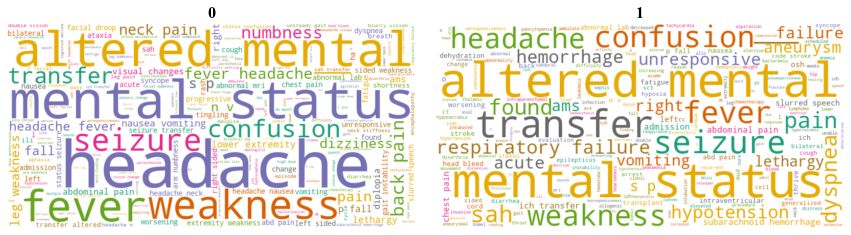

In [4]:
data = df0.copy()

data['Chief Complaint'] = data['Chief Complaint'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    return re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()

# Apply the function to the 'Chief Complaint' column
data['Chief Complaint'] = data['Chief Complaint'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['Chief Complaint'].apply(lambda x: ' '.join(str(i) for i in x))

# Generate a word cloud for each group
wordclouds = []
for group_name, group_data in groups.items():   # groups.items(): output keys and values in same time.
    # Create a word cloud object and generate the word cloud
    wc = WordCloud(width=800, height=400, background_color='white', colormap='Dark2',random_state=2023).generate(group_data)
    wordclouds.append((group_name, wc))

# Plot the word clouds
fig, axs = plt.subplots(1, len(wordclouds), figsize=(15, 10))

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05)  # Adjust the value as needed

for i, (group_name, wc) in enumerate(wordclouds):
    axs[i].imshow(wc, interpolation='bilinear')
    axs[i].set_title(group_name, fontsize=16, fontweight='bold')
    axs[i].axis('off')

plt.show()

In [5]:
from sklearn.feature_extraction.text import CountVectorizer

data = df0.copy()

# Convert all text in the ‘Chief Complaint’ column to lower case
data['Chief Complaint'] = data['Chief Complaint'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    return re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()

# Apply the function to the 'Chief Complaint' column
data['Chief Complaint'] = data['Chief Complaint'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['Chief Complaint'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize CountVectorizer
vectorizer = CountVectorizer(stop_words='english')

# Create dictionaries to store the top words for each group
top_words = {0: [], 1: []}
top_words_freq = {0: [], 1: []}

for group_name, group_data in groups.items():
    # Fit and transform the text data
    X = vectorizer.fit_transform([group_data])
    
    # Get the feature names (words) and their corresponding counts
    word_counts = X.toarray().flatten()
    words = vectorizer.get_feature_names_out()
    
    # Create a DataFrame with words and their counts
    word_freq_df = pd.DataFrame({'word': words, 'count': word_counts})
    
    # Sort the DataFrame by count in descending order and get the top 10 words
    top_words_df = word_freq_df.sort_values(by='count', ascending=False).head(10)
    
    # Store the top words in the dictionary
    top_words[group_name] = top_words_df['word'].tolist()
    
    # Store the top words freq in the dictionary
    top_words_freq[group_name] = top_words_df['count'].tolist()

# Create the final DataFrame
result_df = pd.DataFrame({
    'Rank': range(1, 11),
    'Top Words (Class 0)': top_words[0],
    'Freq (Class 0)' : top_words_freq[0],
    'Top Words (Class 1)': top_words[1],
    'Freq (Class 1)' : top_words_freq[1]
})

result_df

,Rank,Top Words (Class 0),Freq (Class 0),Top Words (Class 1),Freq (Class 1)
0,1,headache,1221,status,61
1,2,status,756,mental,60
2,3,weakness,744,altered,59
3,4,pain,722,transfer,40
4,5,mental,719,pain,27
5,6,altered,675,confusion,20
6,7,fever,657,weakness,19
7,8,transfer,478,fever,17
8,9,seizure,371,failure,17
9,10,confusion,312,headache,17


In [6]:
top_words_df

,word,count
299,status,61
214,mental,60
22,altered,59
326,transfer,40
240,pain,27
74,confusion,20
341,weakness,19
132,fever,17
125,failure,17
151,headache,17


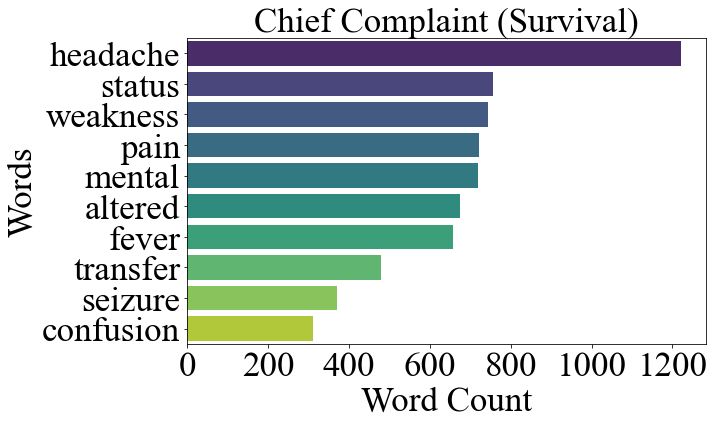

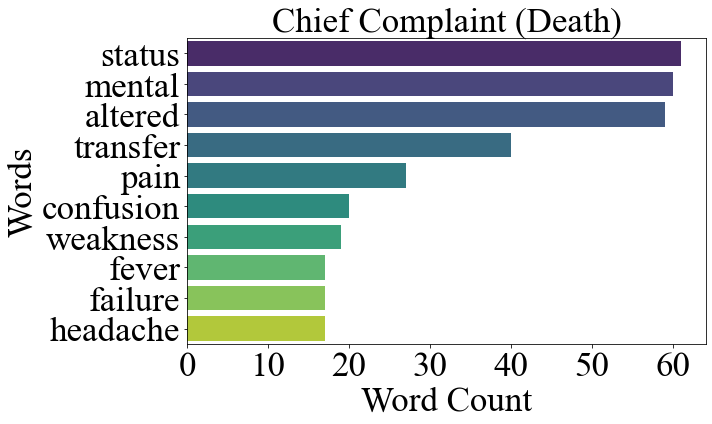

In [7]:
from sklearn.feature_extraction.text import CountVectorizer

data = df0.copy()
data['Chief Complaint'] = data['Chief Complaint'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    return re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()

# Apply the function to the 'Chief Complaint' column
data['Chief Complaint'] = data['Chief Complaint'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['Chief Complaint'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize CountVectorizer
vectorizer = CountVectorizer(stop_words='english')

# Fit and transform the text data
count_matrix = vectorizer.fit_transform(groups)

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Convert the count_matrix to a DataFrame
count_df = pd.DataFrame(count_matrix.T.toarray(), index=words, columns=groups.index)

d_outcome = {0: "Survival", 1: "Death"}

# Function to plot top word counts
def plot_top_word_counts(count_df, group, top_n=10):
    top_words = count_df[group].sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_words.values, y=top_words.index, palette='viridis')
    plt.title(f'Chief Complaint ({d_outcome[group]})', fontsize=35, fontname='Times New Roman')
    plt.xlabel('Word Count', fontsize=35, fontname='Times New Roman')
    plt.ylabel('Words', fontsize=35, fontname='Times New Roman')
    plt.xticks(fontsize=35, fontname='Times New Roman')
    plt.yticks(fontsize=35, fontname='Times New Roman')
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/WordCount", f"Chief_{d_outcome[group]}.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot top word counts for each group
plot_top_word_counts(count_df, 0)
plot_top_word_counts(count_df, 1)

## 2. Statistics after conversion to TF-IDF

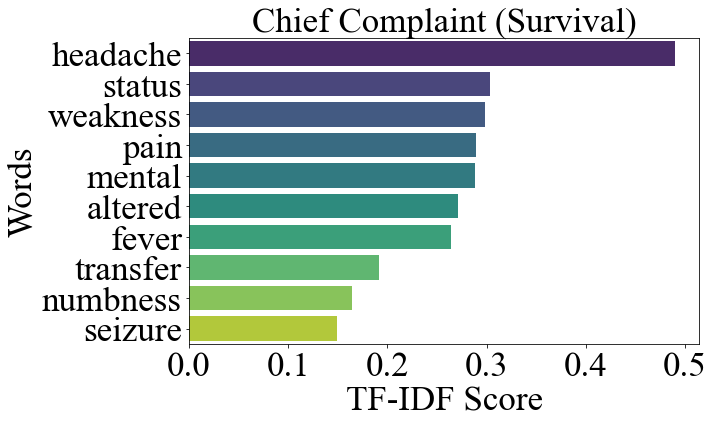

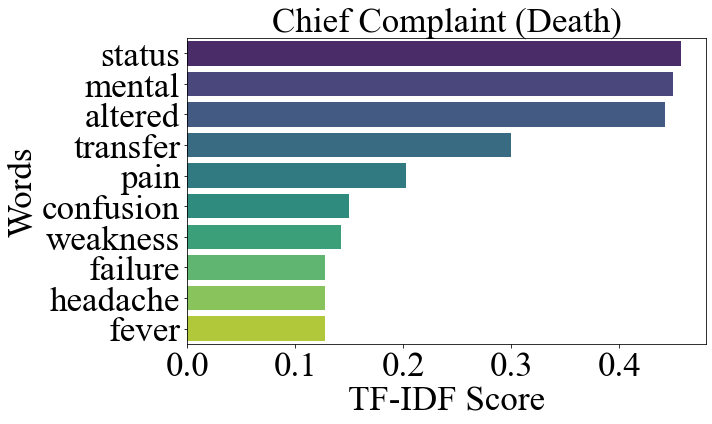

In [8]:
data = df0.copy()

data['Chief Complaint'] = data['Chief Complaint'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    return re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()

# Apply the function to the 'Chief Complaint' column
data['Chief Complaint'] = data['Chief Complaint'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['Chief Complaint'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english')

# Fit and transform the text data
tfidf_matrix = vectorizer.fit_transform(groups)

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Convert the tfidf_matrix to a DataFrame
tfidf_df = pd.DataFrame(tfidf_matrix.T.toarray(), index=words, columns=groups.index)

d_outcome = {0:"Survival",1:"Death"}

# Function to plot top TF-IDF words
def plot_top_tfidf_words(tfidf_df, group, top_n=10):
    top_words = tfidf_df[group].sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_words.values, y=top_words.index, palette='viridis')
#     plt.title(f'Top {top_n} TF-IDF Words for Group {group}', fontsize=35, fontweight='bold', fontname='Times New Roman')
    plt.title(f'Chief Complaint ({d_outcome[group]})', fontsize=35, fontname='Times New Roman')
    plt.xlabel('TF-IDF Score', fontsize=35, fontname='Times New Roman')
    plt.ylabel('Words', fontsize=35, fontname='Times New Roman')
    plt.xticks(fontsize=35, fontname='Times New Roman')
    plt.yticks(fontsize=35, fontname='Times New Roman')
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/TFIDF", f"Chief_{d_outcome[group]}.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot top TF-IDF words for each group
plot_top_tfidf_words(tfidf_df, 0)
plot_top_tfidf_words(tfidf_df, 1)

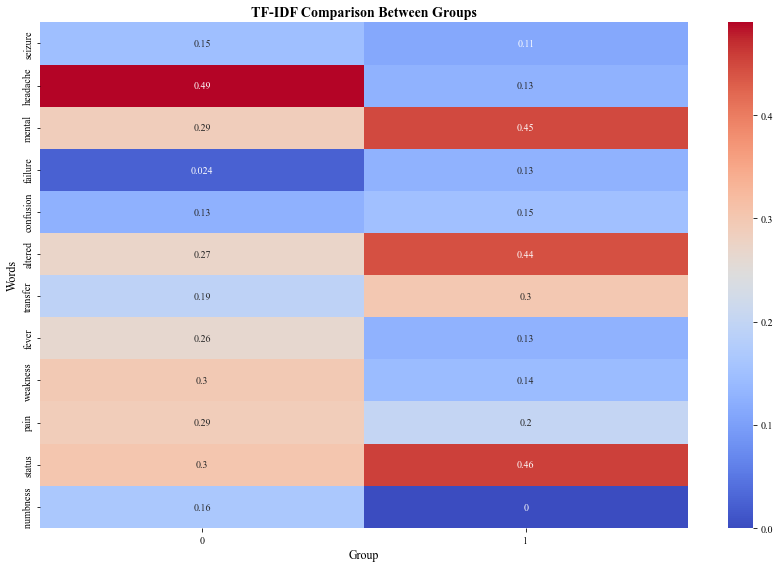

In [9]:
# Heatmap for comparing top TF-IDF words between groups
top_words_0 = tfidf_df[0].sort_values(ascending=False).head(10).index
top_words_1 = tfidf_df[1].sort_values(ascending=False).head(10).index
top_words = list(set(top_words_0).union(set(top_words_1)))

heatmap_data = tfidf_df.loc[top_words]
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', cbar=True)
plt.title('TF-IDF Comparison Between Groups', fontsize=14, fontweight='bold')
plt.xlabel('Group', fontsize=12)
plt.ylabel('Words', fontsize=12)
plt.tight_layout()
plt.show()

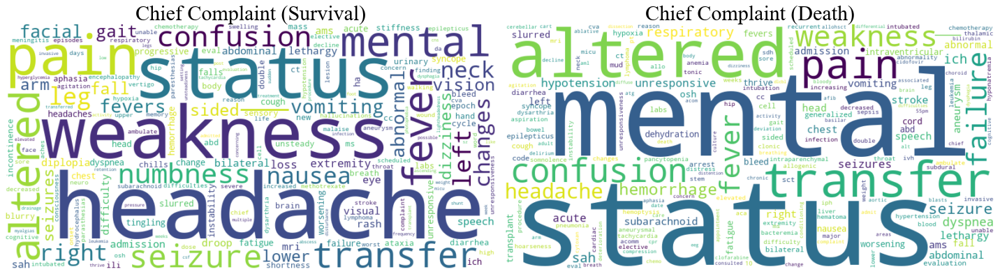

In [10]:
# Word cloud for each group
d_outcome = {0:"Survival",1:"Death"}
def plot_wordclouds_side_by_side(tfidf_df, groups):
    fig, axs = plt.subplots(1, len(groups), figsize=(20, 10))
    
    for i, group in enumerate(groups):
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
        axs[i].imshow(wordcloud, interpolation='bilinear')
#         axs[i].set_title(f'Word Cloud for Group {group}', fontsize=14, fontweight='bold')
        axs[i].set_title(f"Chief Complaint ({d_outcome[group]})", fontsize=30, fontname='Times New Roman')
        axs[i].axis('off')
    
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/cloud_count", f"Chief.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot word clouds for each group side by side
plot_wordclouds_side_by_side(count_df, [0, 1])

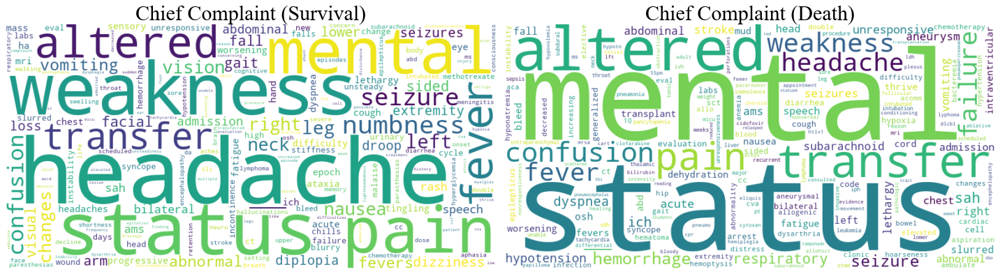

In [11]:
# Word cloud for each group
d_outcome = {0:"Survival",1:"Death"}
def plot_wordclouds_side_by_side(tfidf_df, groups):
    fig, axs = plt.subplots(1, len(groups), figsize=(20, 10))
    
    for i, group in enumerate(groups):
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
        axs[i].imshow(wordcloud, interpolation='bilinear')
#         axs[i].set_title(f'Word Cloud for Group {group}', fontsize=14, fontweight='bold')
        axs[i].set_title(f"Chief Complaint ({d_outcome[group]})", fontsize=30, fontname='Times New Roman')
        axs[i].axis('off')
    
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/cloud", f"Chief.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot word clouds for each group side by side
plot_wordclouds_side_by_side(tfidf_df, [0, 1])

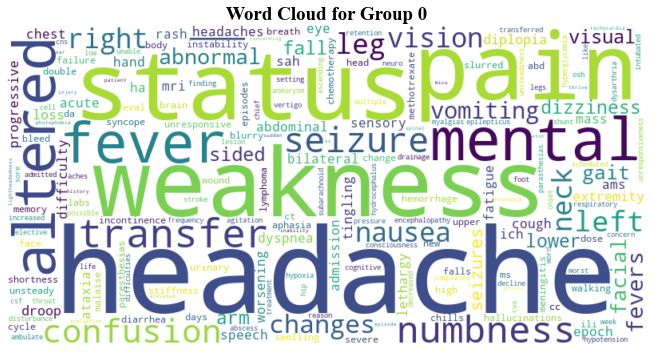

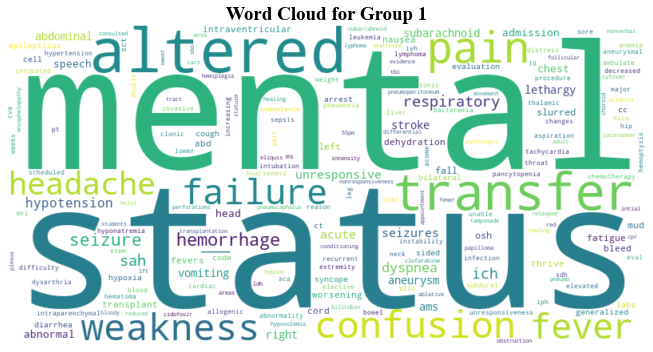

In [12]:
# Word cloud for each group
def plot_wordcloud(tfidf_df, group):
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Group {group}', fontsize=19, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Plot word clouds for each group
plot_wordcloud(tfidf_df, 0)
plot_wordcloud(tfidf_df, 1)

In [13]:
# In the word cloud ‘failure’ I don't know exactly what it means, look it up.
df_temp = df0[df0['Chief Complaint'].fillna('').str.contains('failure')]
df_temp.iloc[0:1][['Chief Complaint']].values

array([['Confusion, episodes of word finding difficulties, forgetfulness, and failure to recognize familiar objects']],
      dtype=object)

# 2, ICD text

## 1. General statistics

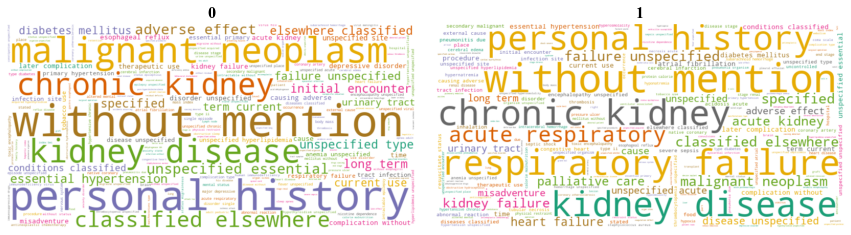

In [14]:
data = df0.copy()

data['icd_title'] = data['icd_title'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    return re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()

# Apply the function to the 'Chief Complaint' column
data['icd_title'] = data['icd_title'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['icd_title'].apply(lambda x: ' '.join(str(i) for i in x))

# Generate a word cloud for each group
wordclouds = []
for group_name, group_data in groups.items():   # groups.items(): output keys and values in same time.
    # Create a word cloud object and generate the word cloud
    wc = WordCloud(width=800, height=400, background_color='white', colormap='Dark2',random_state=2023).generate(group_data)
    wordclouds.append((group_name, wc))

# Plot the word clouds
fig, axs = plt.subplots(1, len(wordclouds), figsize=(15, 10))

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05)  # Adjust the value as needed

for i, (group_name, wc) in enumerate(wordclouds):
    axs[i].imshow(wc, interpolation='bilinear')
    axs[i].set_title(group_name, fontsize=16, fontweight='bold')
    axs[i].axis('off')

plt.show()

In [15]:
from sklearn.feature_extraction.text import CountVectorizer

data = df0.copy()

data['icd_title'] = data['icd_title'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    return re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()

# Apply the function to the 'Chief Complaint' column
data['icd_title'] = data['icd_title'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['icd_title'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize CountVectorizer
vectorizer = CountVectorizer(stop_words='english')

# Create dictionaries to store the top words for each group
top_words = {0: [], 1: []}

for group_name, group_data in groups.items():
    # Fit and transform the text data
    X = vectorizer.fit_transform([group_data])
    
    # Get the feature names (words) and their corresponding counts
    word_counts = X.toarray().flatten()
    words = vectorizer.get_feature_names_out()
    
    # Create a DataFrame with words and their counts
    word_freq_df = pd.DataFrame({'word': words, 'count': word_counts})
    
    # Sort the DataFrame by count in descending order and get the top 10 words
    top_words_df = word_freq_df.sort_values(by='count', ascending=False).head(10)
    
    # Store the top words in the dictionary
    top_words[group_name] = top_words_df['word'].tolist()

# Create the final DataFrame
result_df = pd.DataFrame({
    'Rank': range(1, 11),
    'Top Words (Class 0)': top_words[0],
    'Top Words (Class 1)': top_words[1]
})

result_df

,Rank,Top Words (Class 0),Top Words (Class 1)
0,1,unspecified,unspecified
1,2,disease,acute
2,3,chronic,failure
3,4,history,disease
4,5,mention,chronic
5,6,acute,kidney
6,7,personal,specified
7,8,kidney,status
8,9,specified,mention
9,10,status,classified


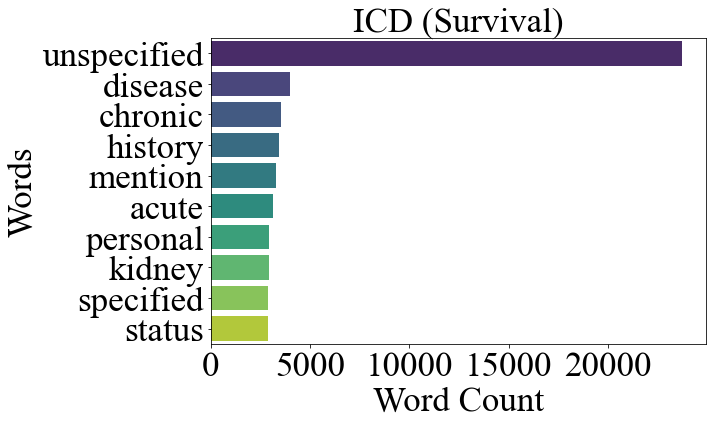

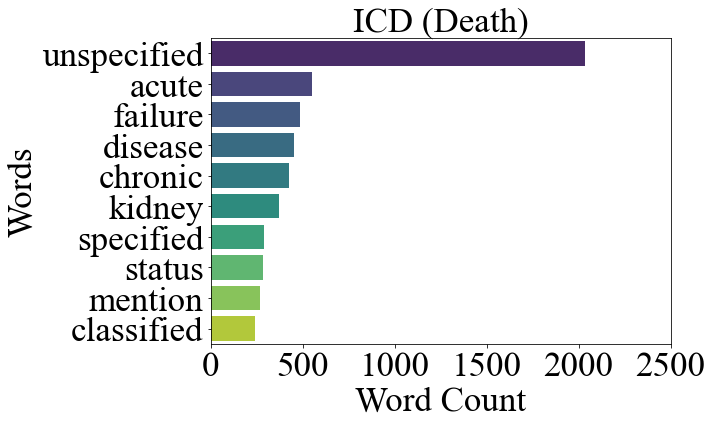

In [16]:
from sklearn.feature_extraction.text import CountVectorizer

data = df0.copy()
data['icd_title'] = data['icd_title'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    return re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()

# Apply the function to the 'Chief Complaint' column
data['icd_title'] = data['icd_title'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['icd_title'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize CountVectorizer
vectorizer = CountVectorizer(stop_words='english')

# Fit and transform the text data
count_matrix = vectorizer.fit_transform(groups)

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Convert the count_matrix to a DataFrame
count_df = pd.DataFrame(count_matrix.T.toarray(), index=words, columns=groups.index)

d_outcome = {0: "Survival", 1: "Death"}

# Function to plot top word counts
def plot_top_word_counts(count_df, group, top_n=10):
    top_words = count_df[group].sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_words.values, y=top_words.index, palette='viridis')
    plt.title(f'ICD ({d_outcome[group]})', fontsize=35, fontname='Times New Roman')
    plt.xlabel('Word Count', fontsize=35, fontname='Times New Roman')
    plt.ylabel('Words', fontsize=35, fontname='Times New Roman')
    plt.xticks(fontsize=35, fontname='Times New Roman')
    plt.yticks(fontsize=35, fontname='Times New Roman')
    if group == 1:
        plt.xticks(ticks=range(0, max(top_words.values) + 500, 500), fontsize=35, fontname='Times New Roman')
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/WordCount", f"ICD_{d_outcome[group]}.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot top word counts for each group
plot_top_word_counts(count_df, 0)
plot_top_word_counts(count_df, 1)

## 2. Statistics after conversion to TF-IDF

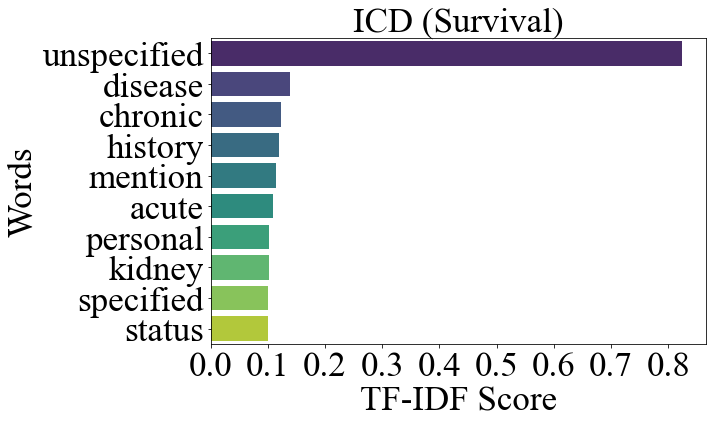

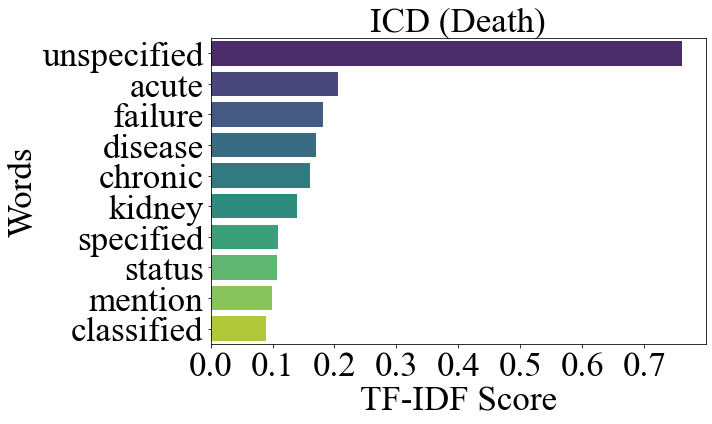

In [17]:
data = df0.copy()

data['icd_title'] = data['icd_title'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    return re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()

# Apply the function to the 'Chief Complaint' column
data['icd_title'] = data['icd_title'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['icd_title'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english')

# Fit and transform the text data
tfidf_matrix = vectorizer.fit_transform(groups)

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Convert the tfidf_matrix to a DataFrame
tfidf_df = pd.DataFrame(tfidf_matrix.T.toarray(), index=words, columns=groups.index)

d_outcome = {0:"Survival",1:"Death"}

# Function to plot top TF-IDF words
def plot_top_tfidf_words(tfidf_df, group, top_n=10):
    top_words = tfidf_df[group].sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_words.values, y=top_words.index, palette='viridis')
#     plt.title(f'Top {top_n} TF-IDF Words for Group {group}', fontsize=20, fontweight='bold')
    plt.title(f'ICD ({d_outcome[group]})', fontsize=35, fontname='Times New Roman')
    plt.xlabel('TF-IDF Score', fontsize=35, fontname='Times New Roman')
    plt.ylabel('Words', fontsize=35, fontname='Times New Roman')
    plt.xticks(fontsize=35, fontname='Times New Roman')
    plt.yticks(fontsize=35, fontname='Times New Roman')
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/TFIDF", f"ICD_{d_outcome[group]}.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot top TF-IDF words for each group
plot_top_tfidf_words(tfidf_df, 0)
plot_top_tfidf_words(tfidf_df, 1)

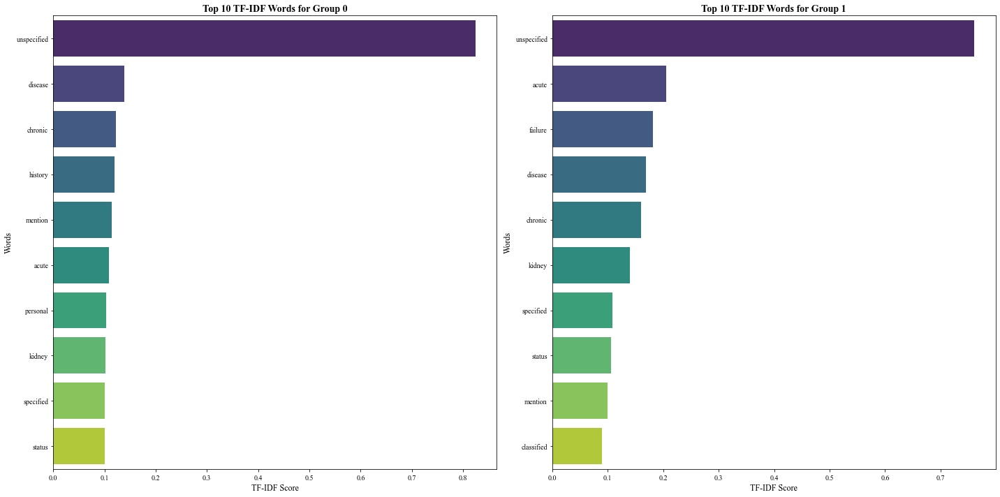

In [18]:
data = df0.copy()

data['icd_title'] = data['icd_title'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    return re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()

# Apply the function to the 'icd_title' column
data['icd_title'] = data['icd_title'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['icd_title'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english')

# Fit and transform the text data
tfidf_matrix = vectorizer.fit_transform(groups)

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Convert the tfidf_matrix to a DataFrame
tfidf_df = pd.DataFrame(tfidf_matrix.T.toarray(), index=words, columns=groups.index)

# Function to plot top TF-IDF words side by side
def plot_top_tfidf_words_side_by_side(tfidf_df, groups, top_n=10):
    fig, axs = plt.subplots(1, len(groups), figsize=(20, 10))

    for i, group in enumerate(groups):
        top_words = tfidf_df[group].sort_values(ascending=False).head(top_n)
        sns.barplot(x=top_words.values, y=top_words.index, palette='viridis', ax=axs[i])
        axs[i].set_title(f'Top {top_n} TF-IDF Words for Group {group}', fontsize=14, fontweight='bold')
        axs[i].set_xlabel('TF-IDF Score', fontsize=12)
        axs[i].set_ylabel('Words', fontsize=12)
    
    plt.tight_layout()
    plt.show()

# Plot top TF-IDF words for each group side by side
plot_top_tfidf_words_side_by_side(tfidf_df, [0, 1])

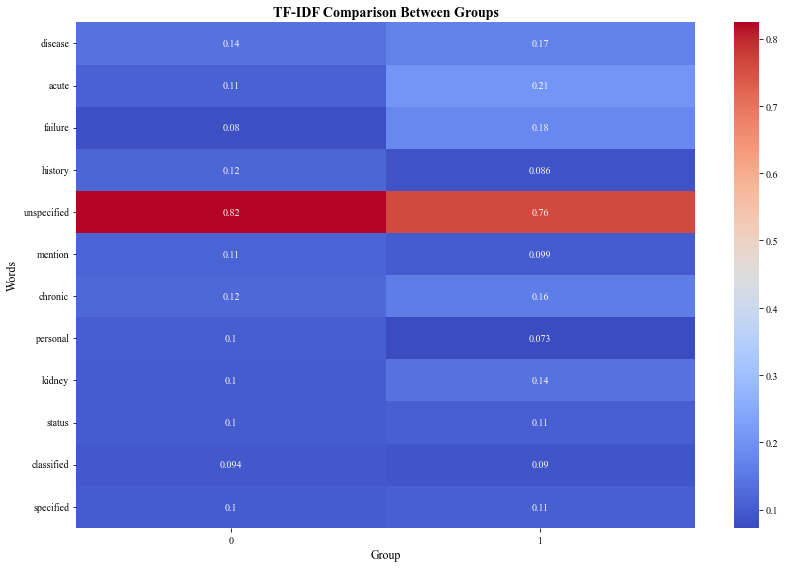

In [19]:
# Heatmap for comparing top TF-IDF words between groups
top_words_0 = tfidf_df[0].sort_values(ascending=False).head(10).index
top_words_1 = tfidf_df[1].sort_values(ascending=False).head(10).index
top_words = list(set(top_words_0).union(set(top_words_1)))

heatmap_data = tfidf_df.loc[top_words]
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', cbar=True)
plt.title('TF-IDF Comparison Between Groups', fontsize=14, fontweight='bold')
plt.xlabel('Group', fontsize=12)
plt.ylabel('Words', fontsize=12)
plt.tight_layout()
plt.show()

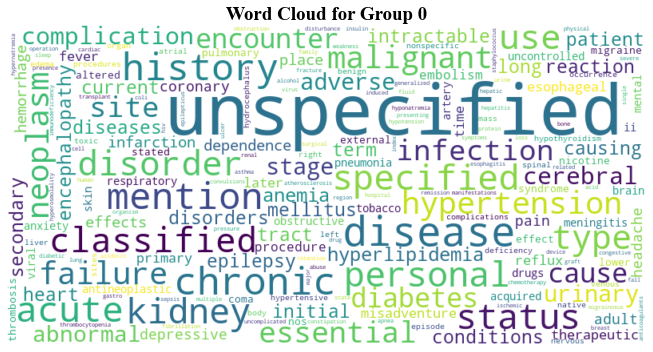

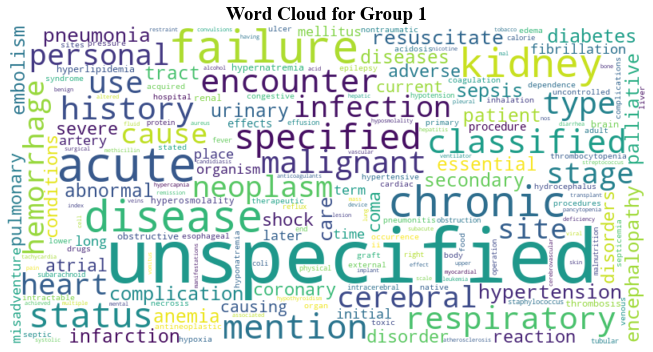

In [20]:
# Word cloud for each group
def plot_wordcloud(tfidf_df, group):
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Group {group}', fontsize=19, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Plot word clouds for each group
plot_wordcloud(tfidf_df, 0)
plot_wordcloud(tfidf_df, 1)

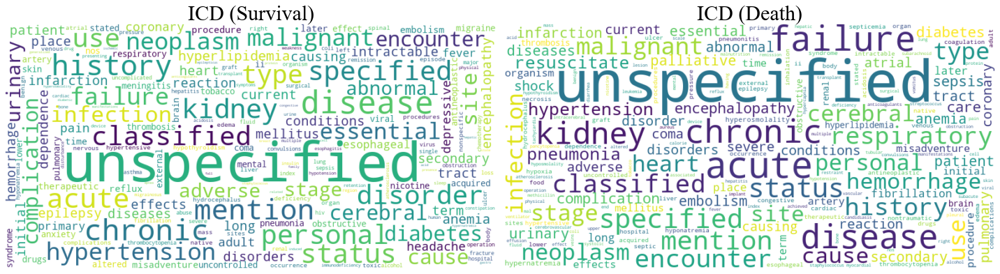

In [21]:
# Word cloud for each group
d_outcome = {0:"Survival",1:"Death"}
def plot_wordclouds_side_by_side(tfidf_df, groups):
    fig, axs = plt.subplots(1, len(groups), figsize=(20, 10))
    
    for i, group in enumerate(groups):
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
        axs[i].imshow(wordcloud, interpolation='bilinear')
        axs[i].set_title(f"ICD ({d_outcome[group]})", fontsize=30, fontname='Times New Roman')
        axs[i].axis('off')
    
    plt.tight_layout()
    
    # 保存图形
    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/cloud_count", f"ICD.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot word clouds for each group side by side
plot_wordclouds_side_by_side(count_df, [0, 1])

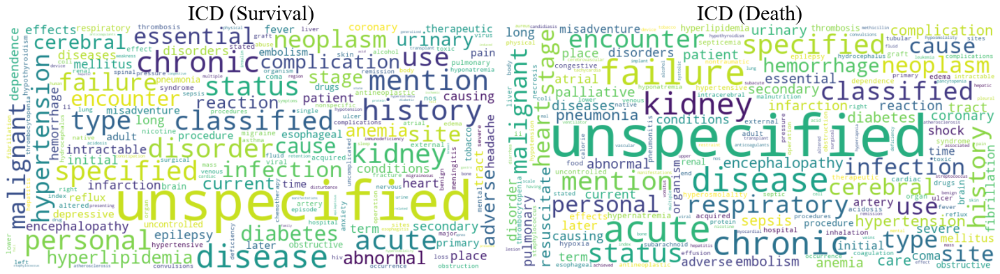

In [22]:
# Word cloud for each group
d_outcome = {0:"Survival",1:"Death"}
def plot_wordclouds_side_by_side(tfidf_df, groups):
    fig, axs = plt.subplots(1, len(groups), figsize=(20, 10))
    
    for i, group in enumerate(groups):
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
        axs[i].imshow(wordcloud, interpolation='bilinear')
        axs[i].set_title(f"ICD ({d_outcome[group]})", fontsize=30, fontname='Times New Roman')
        axs[i].axis('off')
    
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/cloud", f"ICD.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot word clouds for each group side by side
plot_wordclouds_side_by_side(tfidf_df, [0, 1])

# 3, History of Present Illness

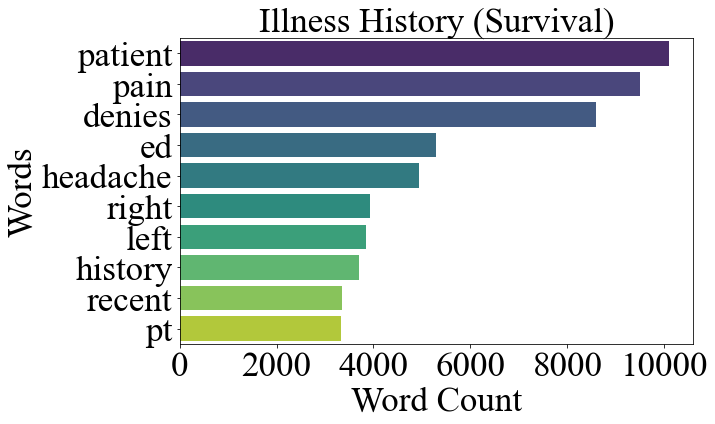

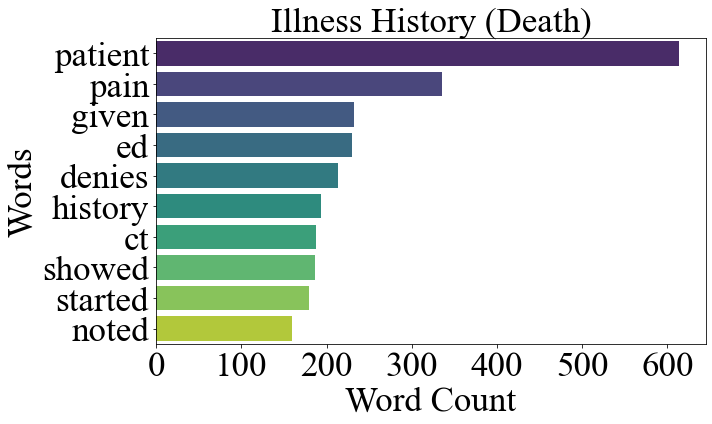

In [23]:
from sklearn.feature_extraction.text import CountVectorizer

data = df0.copy()
data['History of Present Illness'] = data['History of Present Illness'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    cleaned_text = re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()
    cleaned_text = cleaned_text.replace('_', '')  # Remove underscores
    return cleaned_text

# Apply the function to the 'Chief Complaint' column
data['History of Present Illness'] = data['History of Present Illness'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['History of Present Illness'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize CountVectorizer
vectorizer = CountVectorizer(stop_words='english')

# Fit and transform the text data
count_matrix = vectorizer.fit_transform(groups)

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Convert the count_matrix to a DataFrame
count_df = pd.DataFrame(count_matrix.T.toarray(), index=words, columns=groups.index)

d_outcome = {0: "Survival", 1: "Death"}

# Function to plot top word counts
def plot_top_word_counts(count_df, group, top_n=10):
    top_words = count_df[group].sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_words.values, y=top_words.index, palette='viridis')
    plt.title(f'Illness History ({d_outcome[group]})', fontsize=35, fontname='Times New Roman')
    plt.xlabel('Word Count', fontsize=35, fontname='Times New Roman')
    plt.ylabel('Words', fontsize=35, fontname='Times New Roman')
    plt.xticks(fontsize=35, fontname='Times New Roman')
    plt.yticks(fontsize=35, fontname='Times New Roman')
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/WordCount", f"Illness_{d_outcome[group]}.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot top word counts for each group
plot_top_word_counts(count_df, 0)
plot_top_word_counts(count_df, 1)

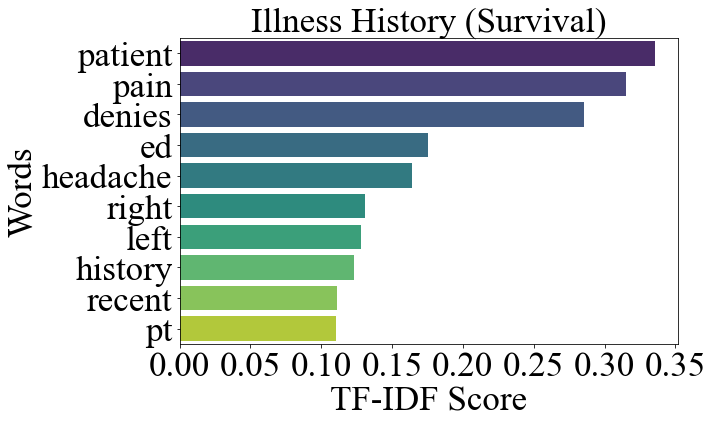

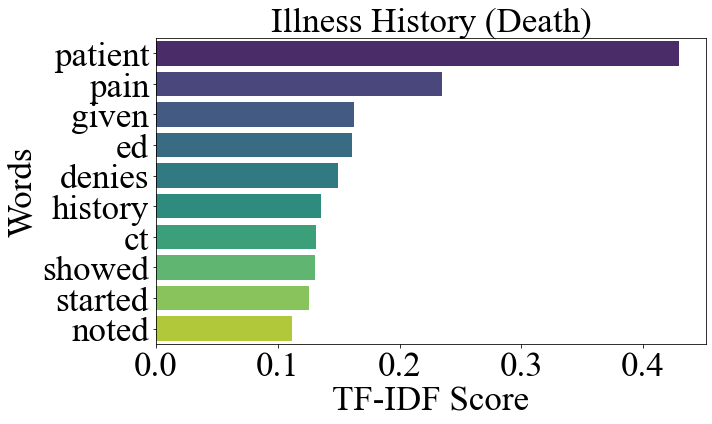

In [24]:
data = df0.copy()

data['History of Present Illness'] = data['History of Present Illness'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    cleaned_text = re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()
    cleaned_text = cleaned_text.replace('_', '')  # Remove underscores
    return cleaned_text

# Apply the function to the 'Chief Complaint' column
data['History of Present Illness'] = data['History of Present Illness'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['History of Present Illness'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english')

# Fit and transform the text data
tfidf_matrix = vectorizer.fit_transform(groups)

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Convert the tfidf_matrix to a DataFrame
tfidf_df = pd.DataFrame(tfidf_matrix.T.toarray(), index=words, columns=groups.index)

d_outcome = {0:"Survival",1:"Death"}

# Function to plot top TF-IDF words
def plot_top_tfidf_words(tfidf_df, group, top_n=10):
    top_words = tfidf_df[group].sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_words.values, y=top_words.index, palette='viridis')
#     plt.title(f'Top {top_n} TF-IDF Words for Group {group}', fontsize=35, fontweight='bold', fontname='Times New Roman')
    plt.title(f'Illness History ({d_outcome[group]})', fontsize=35, fontname='Times New Roman')
    plt.xlabel('TF-IDF Score', fontsize=35, fontname='Times New Roman')
    plt.ylabel('Words', fontsize=35, fontname='Times New Roman')
    plt.xticks(fontsize=35, fontname='Times New Roman')
    plt.yticks(fontsize=35, fontname='Times New Roman')
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/TFIDF", f"Illness_{d_outcome[group]}.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot top TF-IDF words for each group
plot_top_tfidf_words(tfidf_df, 0)
plot_top_tfidf_words(tfidf_df, 1)

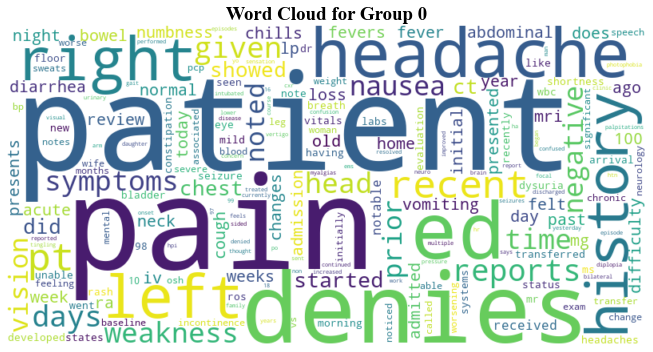

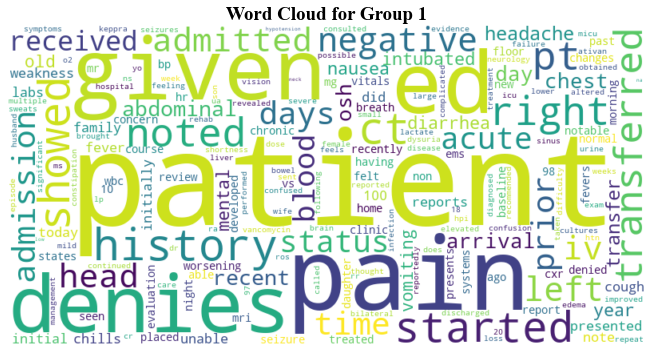

In [25]:
# Word cloud for each group
def plot_wordcloud(tfidf_df, group):
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Group {group}', fontsize=19, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Plot word clouds for each group
plot_wordcloud(tfidf_df, 0)
plot_wordcloud(tfidf_df, 1)

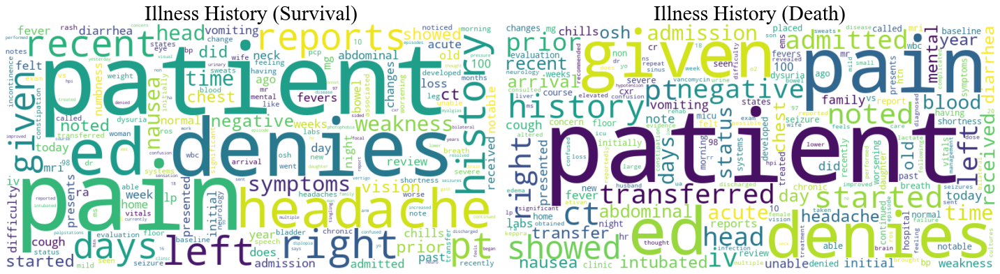

In [26]:
# Word cloud for each group
d_outcome = {0:"Survival",1:"Death"}
def plot_wordclouds_side_by_side(tfidf_df, groups):
    fig, axs = plt.subplots(1, len(groups), figsize=(20, 10))
    
    for i, group in enumerate(groups):
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
        axs[i].imshow(wordcloud, interpolation='bilinear')
#         axs[i].set_title(f'Word Cloud for Group {group}', fontsize=14, fontweight='bold')
        axs[i].set_title(f"Illness History ({d_outcome[group]})", fontsize=30, fontname='Times New Roman')
        axs[i].axis('off')
    
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/cloud_count", f"Ill.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot word clouds for each group side by side
plot_wordclouds_side_by_side(count_df, [0, 1])

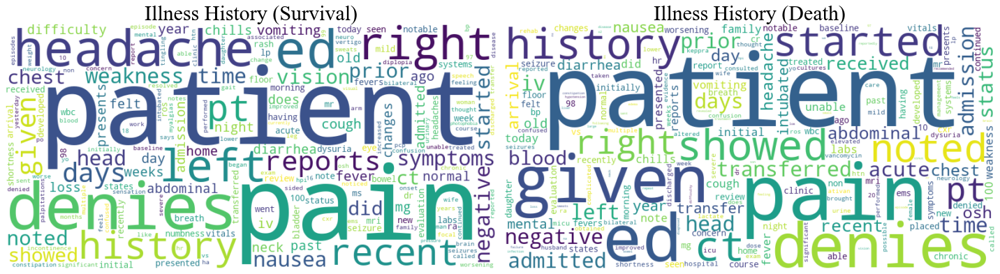

In [27]:
# Word cloud for each group
d_outcome = {0:"Survival",1:"Death"}
def plot_wordclouds_side_by_side(tfidf_df, groups):
    fig, axs = plt.subplots(1, len(groups), figsize=(20, 10))
    
    for i, group in enumerate(groups):
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
        axs[i].imshow(wordcloud, interpolation='bilinear')
#         axs[i].set_title(f'Word Cloud for Group {group}', fontsize=14, fontweight='bold')
        axs[i].set_title(f"Illness History ({d_outcome[group]})", fontsize=30, fontname='Times New Roman')
        axs[i].axis('off')
    
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/cloud", f"Ill.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot word clouds for each group side by side
plot_wordclouds_side_by_side(tfidf_df, [0, 1])

# 4,Past Medical History

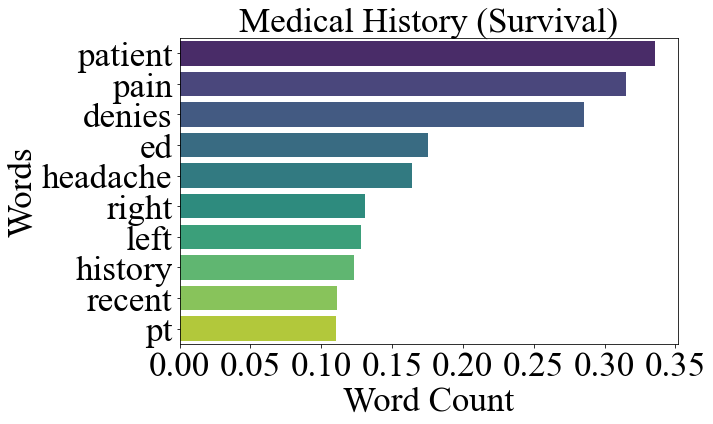

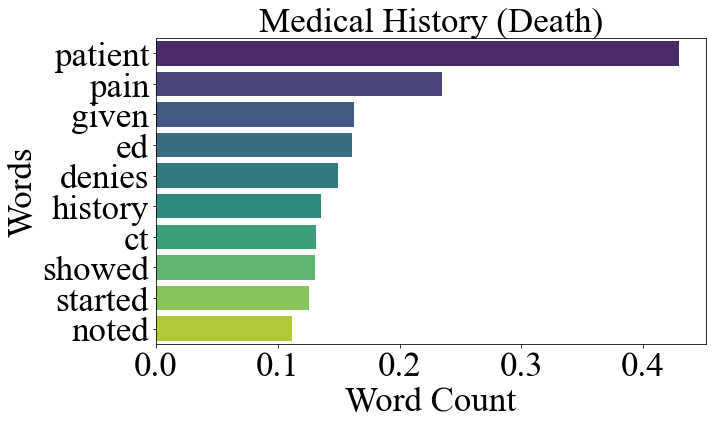

In [28]:
data = df0.copy()

data['Past Medical History'] = data['Past Medical History'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    cleaned_text = re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()
    cleaned_text = cleaned_text.replace('_', '')  # Remove underscores
    return cleaned_text

# Apply the function to the 'Chief Complaint' column
data['Past Medical History'] = data['Past Medical History'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['Past Medical History'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize CountVectorizer
vectorizer = CountVectorizer(stop_words='english')

# Fit and transform the text data
count_matrix = vectorizer.fit_transform(groups)

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Convert the count_matrix to a DataFrame
count_df = pd.DataFrame(count_matrix.T.toarray(), index=words, columns=groups.index)

d_outcome = {0: "Survival", 1: "Death"}

# Function to plot top TF-IDF words
def plot_top_tfidf_words(tfidf_df, group, top_n=10):
    top_words = tfidf_df[group].sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_words.values, y=top_words.index, palette='viridis')
#     plt.title(f'Top {top_n} TF-IDF Words for Group {group}', fontsize=35, fontweight='bold', fontname='Times New Roman')
    plt.title(f'Medical History ({d_outcome[group]})', fontsize=35, fontname='Times New Roman')
    plt.xlabel('Word Count', fontsize=35, fontname='Times New Roman')
    plt.ylabel('Words', fontsize=35, fontname='Times New Roman')
    plt.xticks(fontsize=35, fontname='Times New Roman')
    plt.yticks(fontsize=35, fontname='Times New Roman')
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/WordCount", f"Medical_{d_outcome[group]}.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot top TF-IDF words for each group
plot_top_tfidf_words(tfidf_df, 0)
plot_top_tfidf_words(tfidf_df, 1)

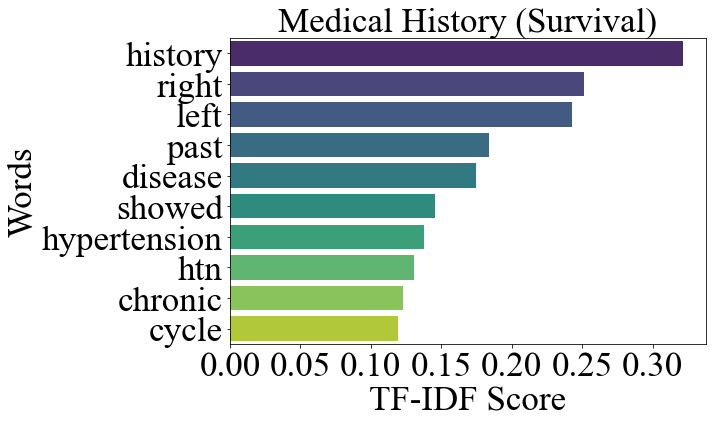

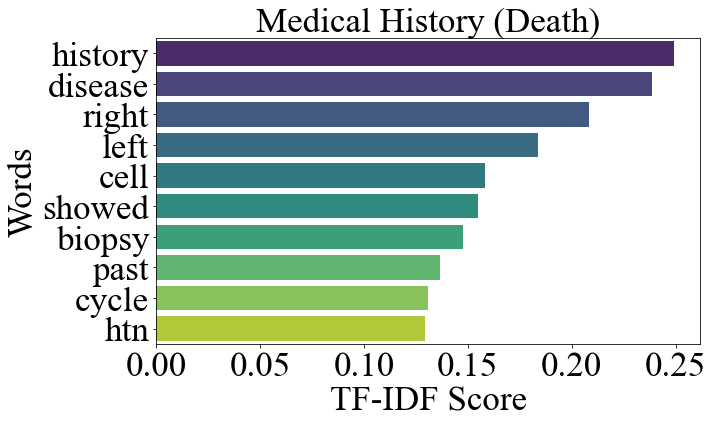

In [29]:
data = df0.copy()

data['Past Medical History'] = data['Past Medical History'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    cleaned_text = re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()
    cleaned_text = cleaned_text.replace('_', '')  # Remove underscores
    return cleaned_text

# Apply the function to the 'Chief Complaint' column
data['Past Medical History'] = data['Past Medical History'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['Past Medical History'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english')

# Fit and transform the text data
tfidf_matrix = vectorizer.fit_transform(groups)

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Convert the tfidf_matrix to a DataFrame
tfidf_df = pd.DataFrame(tfidf_matrix.T.toarray(), index=words, columns=groups.index)

d_outcome = {0:"Survival",1:"Death"}

# Function to plot top TF-IDF words
def plot_top_tfidf_words(tfidf_df, group, top_n=10):
    top_words = tfidf_df[group].sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_words.values, y=top_words.index, palette='viridis')
#     plt.title(f'Top {top_n} TF-IDF Words for Group {group}', fontsize=35, fontweight='bold', fontname='Times New Roman')
    plt.title(f'Medical History ({d_outcome[group]})', fontsize=35, fontname='Times New Roman')
    plt.xlabel('TF-IDF Score', fontsize=35, fontname='Times New Roman')
    plt.ylabel('Words', fontsize=35, fontname='Times New Roman')
    plt.xticks(fontsize=35, fontname='Times New Roman')
    plt.yticks(fontsize=35, fontname='Times New Roman')
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/TFIDF", f"Medical_{d_outcome[group]}.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot top TF-IDF words for each group
plot_top_tfidf_words(tfidf_df, 0)
plot_top_tfidf_words(tfidf_df, 1)

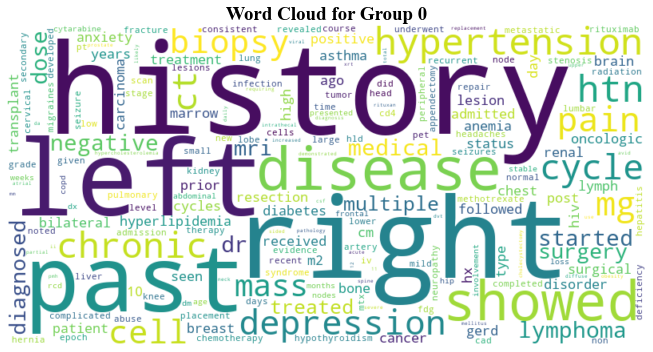

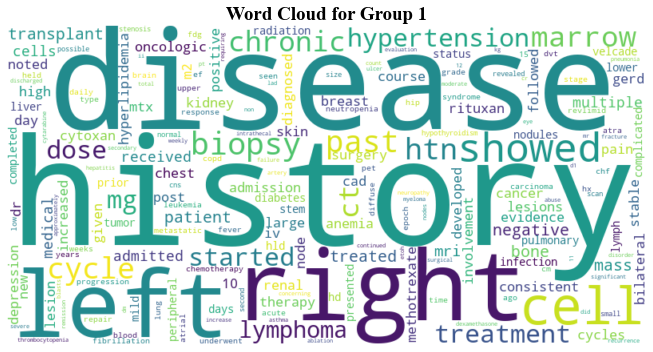

In [30]:
# Word cloud for each group
def plot_wordcloud(tfidf_df, group):
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Group {group}', fontsize=19, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Plot word clouds for each group
plot_wordcloud(tfidf_df, 0)
plot_wordcloud(tfidf_df, 1)

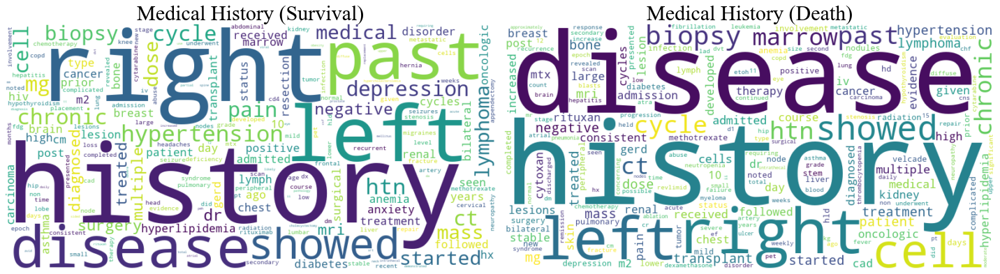

In [31]:
# Word cloud for each group
d_outcome = {0:"Survival",1:"Death"}
def plot_wordclouds_side_by_side(tfidf_df, groups):
    fig, axs = plt.subplots(1, len(groups), figsize=(20, 10))
    
    for i, group in enumerate(groups):
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
        axs[i].imshow(wordcloud, interpolation='bilinear')
#         axs[i].set_title(f'Word Cloud for Group {group}', fontsize=14, fontweight='bold')
        axs[i].set_title(f"Medical History ({d_outcome[group]})", fontsize=30, fontname='Times New Roman')
        axs[i].axis('off')
    
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/cloud_count", f"Medical.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot word clouds for each group side by side
plot_wordclouds_side_by_side(count_df, [0, 1])

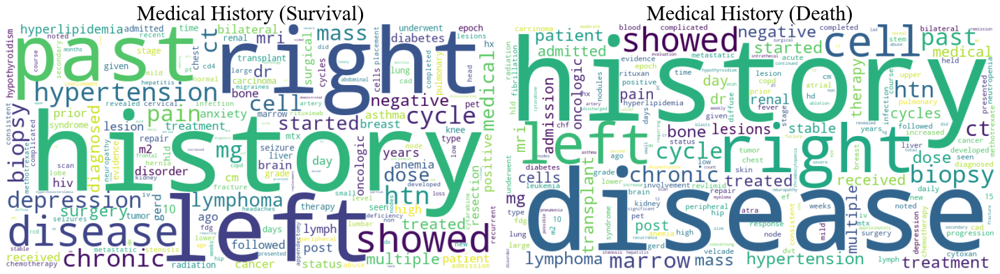

In [32]:
# Word cloud for each group
d_outcome = {0:"Survival",1:"Death"}
def plot_wordclouds_side_by_side(tfidf_df, groups):
    fig, axs = plt.subplots(1, len(groups), figsize=(20, 10))
    
    for i, group in enumerate(groups):
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
        axs[i].imshow(wordcloud, interpolation='bilinear')
#         axs[i].set_title(f'Word Cloud for Group {group}', fontsize=14, fontweight='bold')
        axs[i].set_title(f"Medical History ({d_outcome[group]})", fontsize=30, fontname='Times New Roman')
        axs[i].axis('off')
    
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/cloud", f"Medical.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot word clouds for each group side by side
plot_wordclouds_side_by_side(tfidf_df, [0, 1])

# 5, Allergies

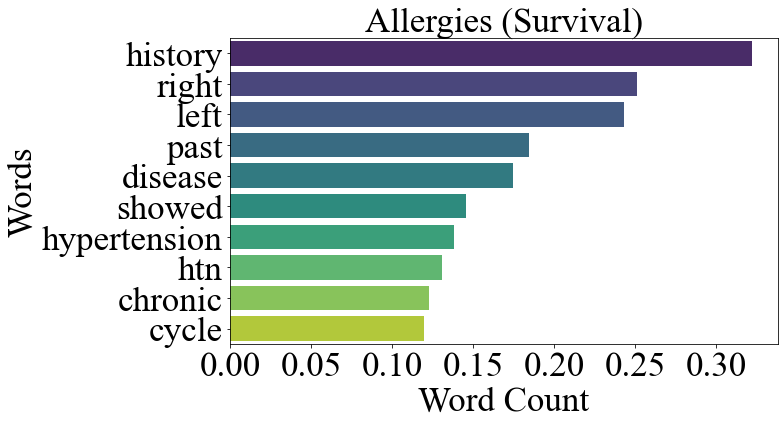

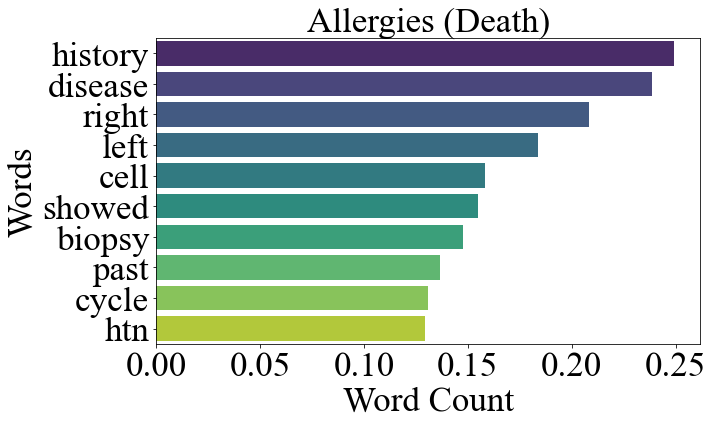

In [33]:
data = df0.copy()

data['Allergies'] = data['Allergies'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    cleaned_text = re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()
    cleaned_text = cleaned_text.replace('_', '')  # Remove underscores
    return cleaned_text

# Apply the function to the 'Chief Complaint' column
data['Allergies'] = data['Allergies'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['Allergies'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize CountVectorizer
vectorizer = CountVectorizer(stop_words='english')

# Fit and transform the text data
count_matrix = vectorizer.fit_transform(groups)

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Convert the count_matrix to a DataFrame
count_df = pd.DataFrame(count_matrix.T.toarray(), index=words, columns=groups.index)

d_outcome = {0: "Survival", 1: "Death"}

# Function to plot top TF-IDF words
def plot_top_tfidf_words(tfidf_df, group, top_n=10):
    top_words = tfidf_df[group].sort_values(ascending=False).head(top_n)
    if group == 0:
        plt.figure(figsize=(11, 6))  # Increase width by 10%
    else:
        plt.figure(figsize=(10, 6))
    sns.barplot(x=top_words.values, y=top_words.index, palette='viridis')
#     plt.title(f'Top {top_n} TF-IDF Words for Group {group}', fontsize=35, fontweight='bold', fontname='Times New Roman')
    plt.title(f'Allergies ({d_outcome[group]})', fontsize=35, fontname='Times New Roman')
    plt.xlabel('Word Count', fontsize=35, fontname='Times New Roman')
    plt.ylabel('Words', fontsize=35, fontname='Times New Roman')
    plt.xticks(fontsize=35, fontname='Times New Roman')
    plt.yticks(fontsize=35, fontname='Times New Roman')
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/WordCount", f"Allergies_{d_outcome[group]}.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot top TF-IDF words for each group
plot_top_tfidf_words(tfidf_df, 0)
plot_top_tfidf_words(tfidf_df, 1)

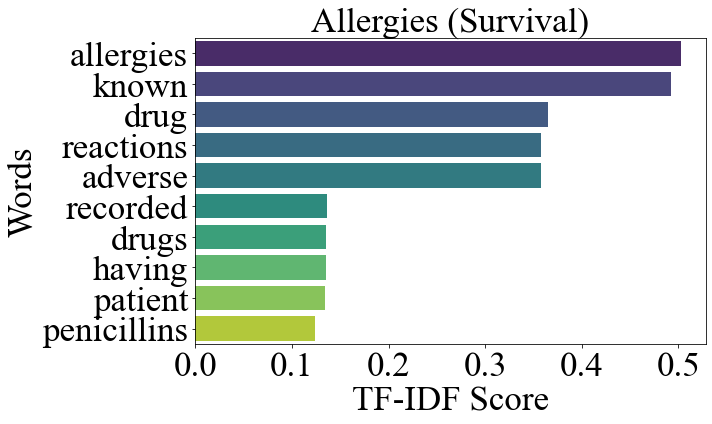

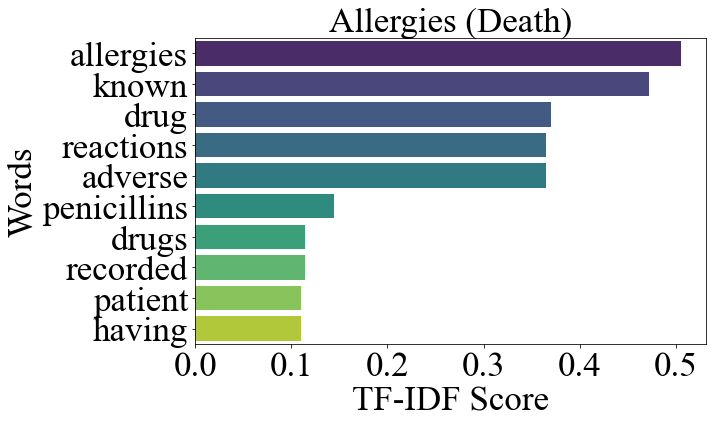

In [34]:
data = df0.copy()

data['Allergies'] = data['Allergies'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    cleaned_text = re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()
    cleaned_text = cleaned_text.replace('_', '')  # Remove underscores
    return cleaned_text

# Apply the function to the 'Chief Complaint' column
data['Allergies'] = data['Allergies'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['Allergies'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english')

# Fit and transform the text data
tfidf_matrix = vectorizer.fit_transform(groups)

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Convert the tfidf_matrix to a DataFrame
tfidf_df = pd.DataFrame(tfidf_matrix.T.toarray(), index=words, columns=groups.index)

d_outcome = {0:"Survival",1:"Death"}

# Function to plot top TF-IDF words
def plot_top_tfidf_words(tfidf_df, group, top_n=10):
    top_words = tfidf_df[group].sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_words.values, y=top_words.index, palette='viridis')
#     plt.title(f'Top {top_n} TF-IDF Words for Group {group}', fontsize=35, fontweight='bold', fontname='Times New Roman')
    plt.title(f'Allergies ({d_outcome[group]})', fontsize=35, fontname='Times New Roman')
    plt.xlabel('TF-IDF Score', fontsize=35, fontname='Times New Roman')
    plt.ylabel('Words', fontsize=35, fontname='Times New Roman')
    plt.xticks(fontsize=35, fontname='Times New Roman')
    plt.yticks(fontsize=35, fontname='Times New Roman')
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/TFIDF", f"Allergies_{d_outcome[group]}.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot top TF-IDF words for each group
plot_top_tfidf_words(tfidf_df, 0)
plot_top_tfidf_words(tfidf_df, 1)

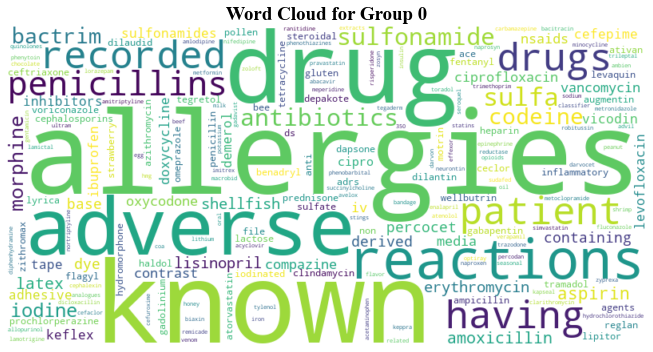

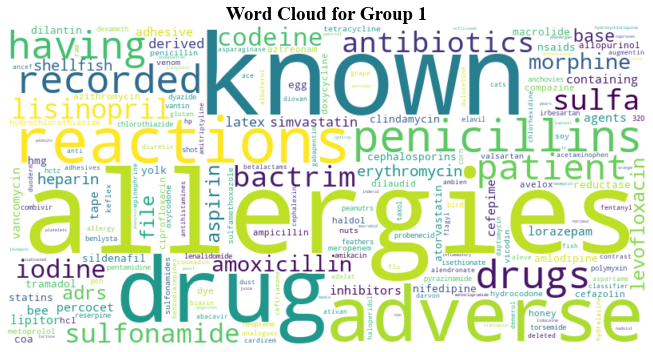

In [35]:
# Word cloud for each group
def plot_wordcloud(tfidf_df, group):
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Group {group}', fontsize=19, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Plot word clouds for each group
plot_wordcloud(tfidf_df, 0)
plot_wordcloud(tfidf_df, 1)

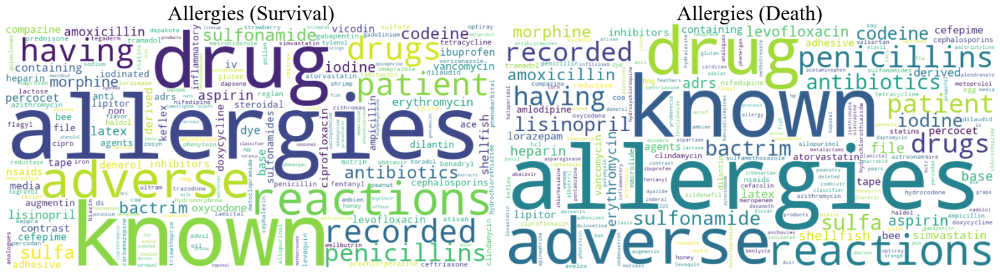

In [36]:
# Word cloud for each group
d_outcome = {0:"Survival",1:"Death"}
def plot_wordclouds_side_by_side(tfidf_df, groups):
    fig, axs = plt.subplots(1, len(groups), figsize=(20, 10))
    
    for i, group in enumerate(groups):
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
        axs[i].imshow(wordcloud, interpolation='bilinear')
#         axs[i].set_title(f'Word Cloud for Group {group}', fontsize=14, fontweight='bold')
        axs[i].set_title(f"Allergies ({d_outcome[group]})", fontsize=30, fontname='Times New Roman')
        axs[i].axis('off')
    
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/cloud_count", f"Allergies.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot word clouds for each group side by side
plot_wordclouds_side_by_side(count_df, [0, 1])

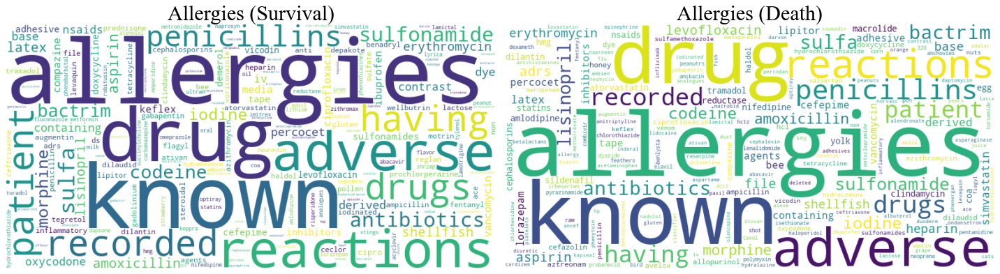

In [37]:
# Word cloud for each group
d_outcome = {0:"Survival",1:"Death"}
def plot_wordclouds_side_by_side(tfidf_df, groups):
    fig, axs = plt.subplots(1, len(groups), figsize=(20, 10))
    
    for i, group in enumerate(groups):
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
        axs[i].imshow(wordcloud, interpolation='bilinear')
#         axs[i].set_title(f'Word Cloud for Group {group}', fontsize=14, fontweight='bold')
        axs[i].set_title(f"Allergies ({d_outcome[group]})", fontsize=30, fontname='Times New Roman')
        axs[i].axis('off')
    
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/cloud", f"Allergies.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot word clouds for each group side by side
plot_wordclouds_side_by_side(tfidf_df, [0, 1])

# 6, Family History

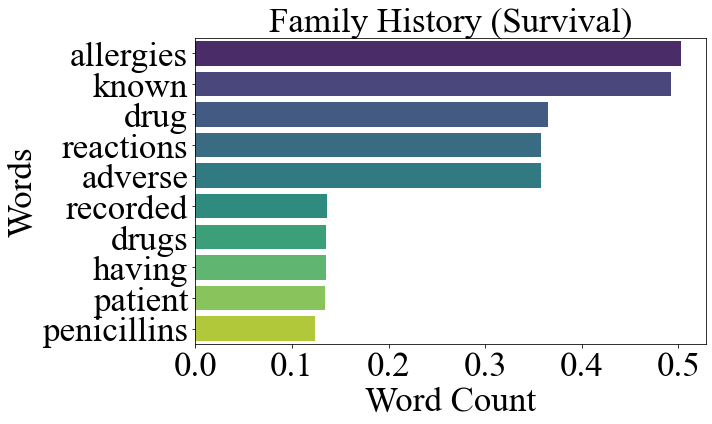

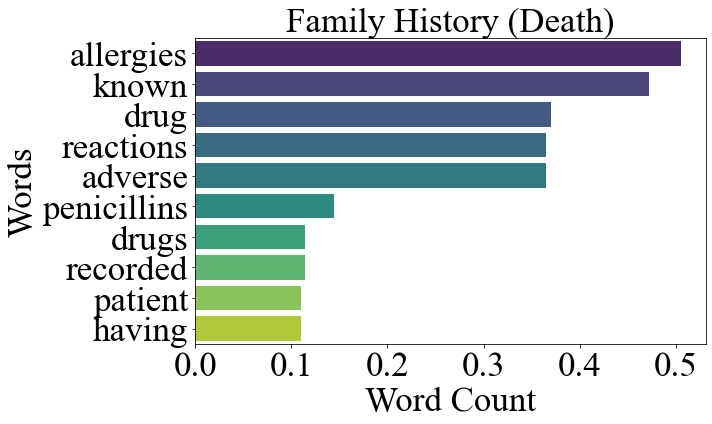

In [38]:
data = df0.copy()

data['Family History'] = data['Family History'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    cleaned_text = re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()
    cleaned_text = cleaned_text.replace('_', '')  # Remove underscores
    return cleaned_text

# Apply the function to the 'Chief Complaint' column
data['Family History'] = data['Family History'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['Family History'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize CountVectorizer
vectorizer = CountVectorizer(stop_words='english')

# Fit and transform the text data
count_matrix = vectorizer.fit_transform(groups)

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Convert the count_matrix to a DataFrame
count_df = pd.DataFrame(count_matrix.T.toarray(), index=words, columns=groups.index)

d_outcome = {0: "Survival", 1: "Death"}

# Function to plot top TF-IDF words
def plot_top_tfidf_words(tfidf_df, group, top_n=10):
    top_words = tfidf_df[group].sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_words.values, y=top_words.index, palette='viridis')
#     plt.title(f'Top {top_n} TF-IDF Words for Group {group}', fontsize=35, fontweight='bold', fontname='Times New Roman')
    plt.title(f'Family History ({d_outcome[group]})', fontsize=35, fontname='Times New Roman')
    plt.xlabel('Word Count', fontsize=35, fontname='Times New Roman')
    plt.ylabel('Words', fontsize=35, fontname='Times New Roman')
    plt.xticks(fontsize=35, fontname='Times New Roman')
    plt.yticks(fontsize=35, fontname='Times New Roman')
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/WordCount", f"Family_{d_outcome[group]}.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot top TF-IDF words for each group
plot_top_tfidf_words(tfidf_df, 0)
plot_top_tfidf_words(tfidf_df, 1)

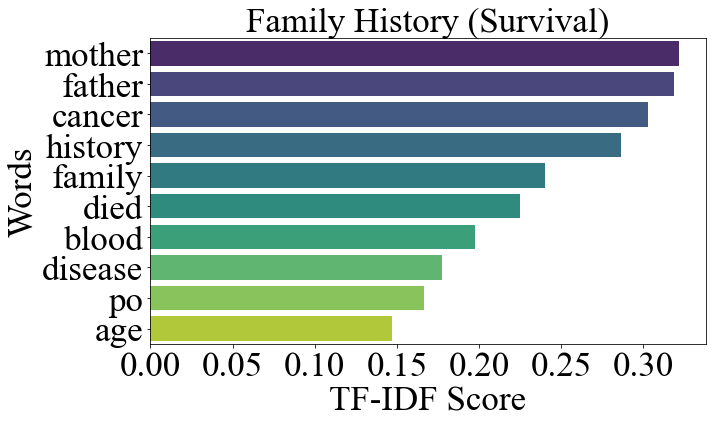

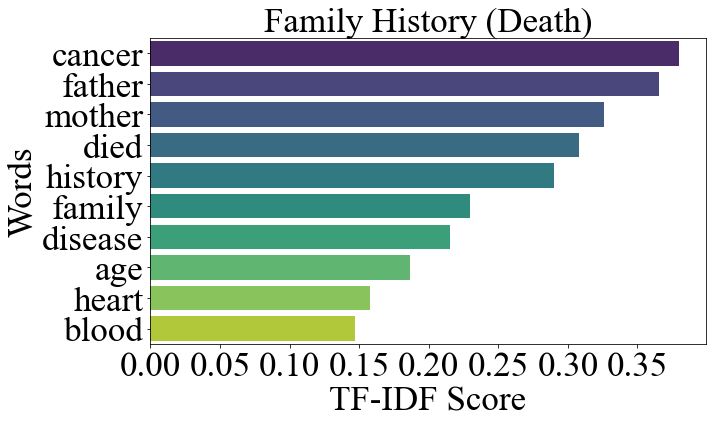

In [39]:
data = df0.copy()

data['Family History'] = data['Family History'].str.lower()

# Define a function to remove 'nan' from a string
def remove_nan(text):
    if pd.isna(text):
        return ''
    cleaned_text = re.sub(r'\bnan\b', '', str(text), flags=re.IGNORECASE).strip()
    cleaned_text = cleaned_text.replace('_', '')  # Remove underscores
    return cleaned_text

# Apply the function to the 'Chief Complaint' column
data['Family History'] = data['Family History'].apply(remove_nan)

# Group the data by label and concatenate the text data for each group
groups = data.groupby('hospital_expire_flag')['Family History'].apply(lambda x: ' '.join(str(i) for i in x))

# Initialize TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english')

# Fit and transform the text data
tfidf_matrix = vectorizer.fit_transform(groups)

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Convert the tfidf_matrix to a DataFrame
tfidf_df = pd.DataFrame(tfidf_matrix.T.toarray(), index=words, columns=groups.index)

d_outcome = {0:"Survival",1:"Death"}

# Function to plot top TF-IDF words
def plot_top_tfidf_words(tfidf_df, group, top_n=10):
    top_words = tfidf_df[group].sort_values(ascending=False).head(top_n)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_words.values, y=top_words.index, palette='viridis')
#     plt.title(f'Top {top_n} TF-IDF Words for Group {group}', fontsize=35, fontweight='bold', fontname='Times New Roman')
    plt.title(f'Family History ({d_outcome[group]})', fontsize=35, fontname='Times New Roman')
    plt.xlabel('TF-IDF Score', fontsize=35, fontname='Times New Roman')
    plt.ylabel('Words', fontsize=35, fontname='Times New Roman')
    plt.xticks(fontsize=35, fontname='Times New Roman')
    plt.yticks(fontsize=35, fontname='Times New Roman')
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/TFIDF", f"Family_{d_outcome[group]}.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot top TF-IDF words for each group
plot_top_tfidf_words(tfidf_df, 0)
plot_top_tfidf_words(tfidf_df, 1)

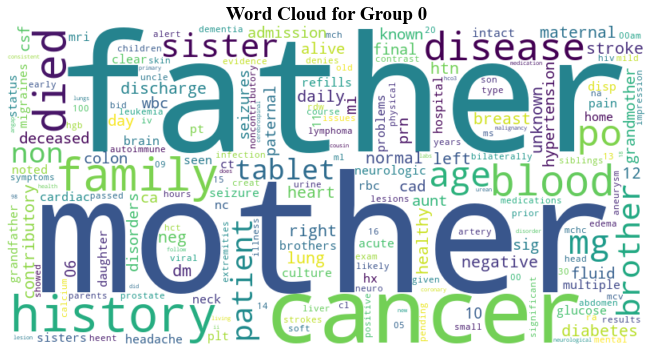

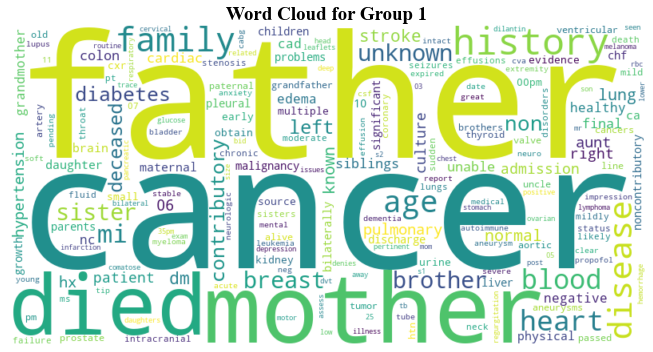

In [40]:
# Word cloud for each group
def plot_wordcloud(tfidf_df, group):
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Group {group}', fontsize=19, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Plot word clouds for each group
plot_wordcloud(tfidf_df, 0)
plot_wordcloud(tfidf_df, 1)

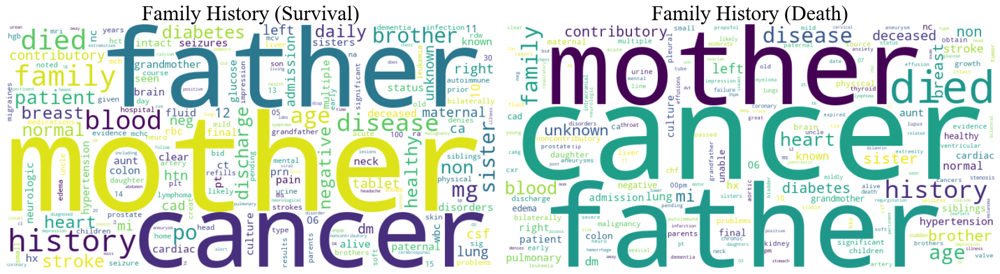

In [41]:
# Word cloud for each group
d_outcome = {0:"Survival",1:"Death"}
def plot_wordclouds_side_by_side(tfidf_df, groups):
    fig, axs = plt.subplots(1, len(groups), figsize=(20, 10))
    
    for i, group in enumerate(groups):
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
        axs[i].imshow(wordcloud, interpolation='bilinear')
#         axs[i].set_title(f'Word Cloud for Group {group}', fontsize=14, fontweight='bold')
        axs[i].set_title(f"Family History ({d_outcome[group]})", fontsize=30, fontname='Times New Roman')
        axs[i].axis('off')
    
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/cloud_count", f"Family.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot word clouds for each group side by side
plot_wordclouds_side_by_side(count_df, [0, 1])

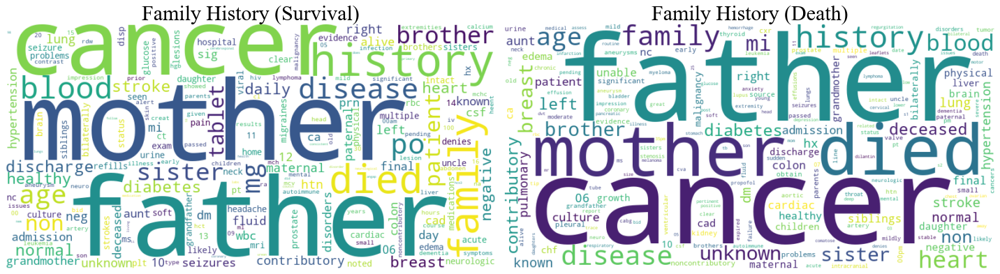

In [42]:
# Word cloud for each group
d_outcome = {0:"Survival",1:"Death"}
def plot_wordclouds_side_by_side(tfidf_df, groups):
    fig, axs = plt.subplots(1, len(groups), figsize=(20, 10))
    
    for i, group in enumerate(groups):
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(tfidf_df[group].to_dict())
        axs[i].imshow(wordcloud, interpolation='bilinear')
#         axs[i].set_title(f'Word Cloud for Group {group}', fontsize=14, fontweight='bold')
        axs[i].set_title(f"Family History ({d_outcome[group]})", fontsize=30, fontname='Times New Roman')
        axs[i].axis('off')
    
    plt.tight_layout()

    path = os.path.join("E:/CNSI_project/demo_and_data_5.0/figure_in_paper/aim2/cloud", f"Family.tif")
    plt.savefig(path, dpi=300, bbox_inches='tight')
    
    plt.show()

# Plot word clouds for each group side by side
plot_wordclouds_side_by_side(tfidf_df, [0, 1])